# Simulación multiagente v4: depósito central y grano por harvester

Parte del modelo de `granja.py` (mismo de los notebooks anteriores). Sobre la
base de v2 (zonas reclamables, tractores que esperan en camino, recarga de
gasolina y el panel de flujo tipo *fleet control loop*) este notebook agrega:

1. **Silo y base en el centro del campo**: en vez de la esquina por defecto,
   se ubican sobre la cruz de camino central usando los parámetros
   `silo_pos`/`base_pos` de `GranjaModel` — siguen siendo dos celdas de
   camino distintas y separadas entre sí por varias celdas (misma razón que
   en v2: compartir celda genera cuello de botella, y quedar vecinas genera
   un *swap* irresoluble entre tractores cruzándose). Al estar en el centro
   en vez de una esquina, harvesters y tractores tienen en promedio menos
   distancia que recorrer para descargar/recargar sin importar en qué parte
   del campo estén trabajando.
2. **Grano cosechado por harvester**: nuevo panel con un gráfico de barras
   de `Harvester.cosechado_total` (contador acumulado por agente que, a
   diferencia de `carga`, no baja al vertir en el tractor), para comparar
   cuánto aportó cada uno a la cosecha total.

In [1]:
import agentpy as ap
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches
from IPython.display import HTML

from granja import GranjaModel, PARAMETROS

print("agentpy", ap.__version__)
PARAMETROS

agentpy 0.1.5


{'shape': (40, 40),
 'ancho_camino': 2,
 'pct_obstaculos': 0.02,
 'n_harvesters': 3,
 'n_tractores': 2,
 'tamano_harvester': 2,
 'velocidad_harvester': 1,
 'capacidad_harvester': 25,
 'gasolina_harvester': 1200,
 'consumo_harvester': 1.0,
 'velocidad_tractor': 2,
 'capacidad_tractor': 80,
 'gasolina_tractor': 1500,
 'consumo_tractor': 0.7,
 'tasa_vertido': 8,
 'umbral_gasolina': 0.2,
 'penalizacion_cosechado_tractor': 3.0,
 'penalizacion_cosechado_harvester': 3.0,
 'prob_descompostura': 0.0,
 'silo_pos': None,
 'base_pos': None,
 'seed': 1,
 'steps': 1200,
 'usar_qlearning_harvester': False,
 'usar_qlearning_tractor': False,
 'qlearning_alpha': 0.1,
 'qlearning_gamma': 0.9,
 'qlearning_epsilon': 0.1}

## Corrida sin animación — métricas del reto

In [2]:
parametros = dict(PARAMETROS)
parametros['shape'] = (30, 30)
parametros['steps'] = 1500

model = GranjaModel(parametros)
results = model.run()
results.reporters

Completed: 382 steps
Run time: 0:00:00.369076
Simulation finished


,seed,pasos,cosechado_pct,grano_entregado,distancia_total,combustible_usado,giros_totales,recargas_totales
0,1,382,100.0,525,1947,1591.8,337,0


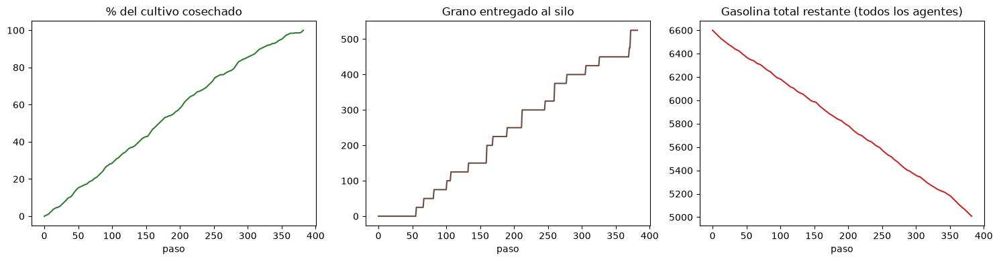

In [3]:
fig, axs = plt.subplots(1, 3, figsize=(15, 4))
data = results.variables.GranjaModel

data['cosechado_pct'].plot(ax=axs[0], color='#2e7d32')
axs[0].set_title('% del cultivo cosechado')
axs[0].set_xlabel('paso')

data['grano_entregado'].plot(ax=axs[1], color='#6d4c41')
axs[1].set_title('Grano entregado al silo')
axs[1].set_xlabel('paso')

data['gasolina_total'].plot(ax=axs[2], color='#c62828')
axs[2].set_title('Gasolina total restante (todos los agentes)')
axs[2].set_xlabel('paso')

plt.tight_layout()
plt.show()

## Poniendo a prueba la recarga

Con tanques chicos, para forzar varias visitas a la gasolinera dentro de la
misma corrida y confirmar que el ciclo cosechar → entregar → recargar no se
traba.

In [4]:
parametros_gas = dict(PARAMETROS)
parametros_gas['shape'] = (26, 26)
parametros_gas['steps'] = 3000
parametros_gas['gasolina_harvester'] = 150
parametros_gas['gasolina_tractor'] = 150
parametros_gas['umbral_gasolina'] = 0.25

modelo_gas = GranjaModel(parametros_gas)
resultados_gas = modelo_gas.run()
resultados_gas.reporters

Completed: 348 steps
Run time: 0:00:00.318493
Simulation finished


,seed,pasos,cosechado_pct,grano_entregado,distancia_total,combustible_usado,giros_totales,recargas_totales
0,1,348,100.0,350,1779,531.0,343,7


## Animación

Colores del campo: café = camino de tierra, verde = cultivo listo, dorado =
cosechado, gris = obstáculo. Cuadro negro = silo (entrega de grano). Cuadro
naranja = base (gasolinera) — celda de camino distinta y separada del silo.
En este notebook ambas están sobre la cruz de camino central (`silo_pos`/
`base_pos`) en vez de la esquina por defecto.

Harvesters (triángulo): azul = operando, naranja = esperando tractor, morado
= vertiendo, negro = recargando, rojo oscuro = sin gasolina, café oscuro =
descompuesto (avería mecánica permanente — ver más abajo).

Tractores (círculo): gris = libre, amarillo = escoltando a su harvester,
naranja = en camino a atender una llamada, morado = descargando, azul = yendo
al silo, negro = recargando. Mientras escoltan ya no entran al cultivo: se
quedan en la casilla de camino más cercana al harvester que siguen, y solo
cruzan campo cuando de verdad los llaman a recoger carga (evitando además,
en ese trayecto, pisar cultivo ya cosechado si rodear por camino no sale
mucho más caro).

Panel derecho: barra de gasolina (% del tanque) de cada harvester (H0, H1, …)
y tractor (T0, T1, …), con una línea punteada roja marcando el umbral de
recarga (`umbral_gasolina`). Para esta animación se usan tanques más chicos
y un umbral más alto que el default (`gasolina_harvester=250`,
`gasolina_tractor=300`, `umbral_gasolina=0.35`) — así se alcanza a ver el
ciclo de recarga en una corrida corta, sin acercarse al punto donde a algún
agente se le acabaría la gasolina antes de volver a la base.

**Averías (`prob_descompostura`)**: cada paso, un harvester `operando` tiene
esa probabilidad de descomponerse para siempre. Al pasar, suelta su celda
reservada y cede su zona (`model.propietario_zona`) para que un hermano
activo la reclame — mismo mecanismo que ya usan al terminar su propia zona.
Si ya traía grano a bordo, todavía llama a un tractor para no perderlo antes
de quedar inmóvil. Desactivado por default (`prob_descompostura=0.0` en
`PARAMETROS`); esta animación usa `0.001` para que sea razonablemente
probable ver al menos una avería en la corrida.</cell_type>


Panel derecho (extra): diagrama de flujo tipo *fleet control loop* (datos de campo/flota, motor de coordinacion, asignacion de tareas, harvesters, tractores/logistica y telemetria/feedback). Cada caja se enciende en verde mientras la condicion de estado que representa sigue siendo cierta en ese frame (por ejemplo, "logistica" se enciende mientras haya algun tractor en camino, descargando o yendo al silo); no hay eventos explicitos por paso, solo lectura del estado actual del modelo.

Panel de grano por harvester: barras con `cosechado_total` de cada uno
(celdas cosechadas acumuladas, no baja al vertir en el tractor como sí
pasa con `carga`) — deja ver si el reparto de zonas terminó parejo o si
algún harvester cargó con más trabajo que el resto.

In [5]:
COLOR_TERRENO = mcolors.ListedColormap(
    ['#c2a878', '#7cb342', '#c9b458', '#4a4a4a'])  # camino, listo, cosechado, obstaculo

COLOR_HARVESTER = {
    'operando': '#1565c0',
    'esperando_tractor': '#ef6c00',
    'vertiendo': '#6a1b9a',
    'recargando': '#212121',
    'sin_gasolina': '#b71c1c',
    'descompuesto': '#4e342e',
}

COLOR_TRACTOR = {
    'libre': '#9e9e9e',
    'escoltando': '#fdd835',
    'en_camino': '#ef6c00',
    'descargando': '#6a1b9a',
    'al_silo': '#1565c0',
    'recargando': '#212121',
    'sin_gasolina': '#b71c1c',
}


def dibujar_campo(model, ax):
    ax.clear()
    ax.imshow(model.campo.terreno, cmap=COLOR_TERRENO, vmin=0, vmax=3, origin='upper')

    silo = model.silo
    base = model.base
    ax.scatter([silo[1]], [silo[0]], marker='s', c='black', s=140, zorder=5)
    ax.scatter([base[1]], [base[0]], marker='s', c='#ef6c00', s=140, zorder=5)

    if len(model.harvesters):
        hy = [h.ubicacion[0] for h in model.harvesters]
        hx = [h.ubicacion[1] for h in model.harvesters]
        colores = [COLOR_HARVESTER.get(h.estado, 'gray') for h in model.harvesters]
        ax.scatter(hx, hy, marker='^', c=colores, s=160,
                   edgecolors='white', linewidths=1, zorder=6)

    if len(model.tractores):
        ty = [t.ubicacion[0] for t in model.tractores]
        tx = [t.ubicacion[1] for t in model.tractores]
        colores_t = [COLOR_TRACTOR.get(t.estado, 'red') for t in model.tractores]
        ax.scatter(tx, ty, marker='o', c=colores_t, s=120,
                   edgecolors='white', linewidths=1, zorder=6)

    pct = 100 * model.cosechado / model.campo.total_cultivo
    ax.set_title(f"t={model.t}   cosechado={pct:.1f}%   grano entregado={model.entregado}")
    ax.set_xticks([])
    ax.set_yticks([])


def dibujar_gasolina(model, ax):
    ax.clear()
    harvesters = list(model.harvesters)
    tractores = list(model.tractores)
    agentes = harvesters + tractores
    etiquetas = [f'H{i}' for i in range(len(harvesters))] + [f'T{i}' for i in range(len(tractores))]
    niveles = [100 * a.gasolina / a.gasolina_max for a in agentes]
    colores = [COLOR_HARVESTER['operando']] * len(harvesters) + [COLOR_TRACTOR['al_silo']] * len(tractores)

    y_pos = range(len(agentes))
    ax.barh(y_pos, niveles, color=colores, edgecolor='white', height=0.7)
    for y, nivel in zip(y_pos, niveles):
        ax.text(min(nivel + 3, 90), y, f'{nivel:.0f}%', va='center', fontsize=8)

    umbral = 100 * model.p.umbral_gasolina
    ax.axvline(umbral, color='#c62828', linestyle='--', linewidth=1)

    ax.set_yticks(list(y_pos))
    ax.set_yticklabels(etiquetas)
    ax.invert_yaxis()
    ax.set_xlim(0, 100)
    ax.set_xlabel('gasolina %')
    ax.set_title('Nivel de tanque')


def dibujar_grano(model, ax):
    ax.clear()
    harvesters = list(model.harvesters)
    etiquetas = [f'H{i}' for i in range(len(harvesters))]
    valores = [h.cosechado_total for h in harvesters]
    cmap = plt.colormaps['tab10']
    colores = [cmap(i % 10) for i in range(len(harvesters))]

    ax.bar(etiquetas, valores, color=colores, edgecolor='white')
    tope = max(valores, default=0)
    for i, v in enumerate(valores):
        ax.text(i, v + max(tope, 1) * 0.02, str(v), ha='center', va='bottom', fontsize=8)

    ax.set_ylim(0, max(tope, 1) * 1.15)
    ax.set_ylabel('celdas cosechadas')
    ax.set_title('Grano cosechado\npor harvester')


# --- Diagrama de flujo en vivo ("fleet control loop") ---------------------
#
# Igual espiritu que el panel de gasolina: no duplica logica de granja.py,
# solo lee el estado actual del modelo cada frame para decidir que nodo
# "prender". No hay eventos explicitos por paso (el modelo no los expone),
# asi que cada nodo se enciende mientras la condicion de estado que
# representa siga siendo cierta en ese frame, no solo en el instante exacto
# en que empezo.
NODOS_FLUJO = {
    # nombre: (x, y, ancho, alto, etiqueta) en coordenadas de ejes (0-1)
    'datos': (0.04, 0.66, 0.27, 0.18, 'Datos de\ncampo y flota'),
    'coordinacion': (0.365, 0.66, 0.27, 0.18, 'Motor de\ncoordinacion'),
    'asignacion': (0.69, 0.66, 0.27, 0.18, 'Asignacion\nde tareas'),
    'harvesters': (0.04, 0.36, 0.27, 0.18, 'Harvesters'),
    'logistica': (0.69, 0.36, 0.27, 0.18, 'Tractores /\nlogistica'),
    'telemetria': (0.365, 0.05, 0.27, 0.18, 'Telemetria / sensores\n(feedback)'),
}

COLOR_NODO_ACTIVO = '#66bb6a'
COLOR_NODO_INACTIVO = '#eceff1'
COLOR_BORDE_INACTIVO = '#78909c'


def _estado_flujo(model):
    """Que nodos del diagrama estan 'activos' este frame, leyendo solo el
    estado actual de los agentes (sin historial ni eventos por paso)."""
    harvesters = list(model.harvesters)
    tractores = list(model.tractores)
    umbral = model.p.umbral_gasolina

    return {
        'datos': True,  # el campo y la flota siempre estan reportando su estado
        'coordinacion': (any(h.estado == 'esperando_tractor' for h in harvesters)
                         or any(t.estado == 'en_camino' for t in tractores)),
        'asignacion': any(h.estado == 'operando' and h.objetivo is not None for h in harvesters),
        'harvesters': any(h.estado == 'operando' for h in harvesters),
        'logistica': any(t.estado in ('en_camino', 'descargando', 'al_silo') for t in tractores),
        'telemetria': (any(h.gasolina <= h.gasolina_max * umbral for h in harvesters)
                       or any(t.gasolina <= t.gasolina_max * umbral for t in tractores)
                       or any(h.estado == 'recargando' for h in harvesters)
                       or any(t.estado == 'recargando' for t in tractores)),
    }


def _centro_nodo(nombre):
    x, y, w, h, _ = NODOS_FLUJO[nombre]
    return (x + w / 2, y + h / 2)


def dibujar_flujo(model, ax):
    ax.clear()
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.axis('off')
    ax.set_title('Fleet control loop', fontsize=10)

    activos = _estado_flujo(model)

    conexiones = [
        ('datos', 'coordinacion', '-'),
        ('coordinacion', 'asignacion', '-'),
        ('coordinacion', 'harvesters', '-'),
        ('coordinacion', 'logistica', '-'),
        ('coordinacion', 'telemetria', '--'),  # linea de feedback, como en el original
        ('harvesters', 'telemetria', '-'),
        ('logistica', 'telemetria', '-'),
    ]
    for origen, destino, estilo in conexiones:
        encendida = activos[origen] and activos[destino]
        color = COLOR_NODO_ACTIVO if encendida else COLOR_BORDE_INACTIVO
        flecha = mpatches.FancyArrowPatch(
            _centro_nodo(origen), _centro_nodo(destino),
            arrowstyle='-|>', mutation_scale=12,
            linestyle=estilo, linewidth=1.8 if encendida else 1.0,
            color=color, shrinkA=28, shrinkB=28, zorder=2)
        ax.add_patch(flecha)

    for nombre, (x, y, w, h, etiqueta) in NODOS_FLUJO.items():
        encendido = activos[nombre]
        color_borde = COLOR_NODO_ACTIVO if encendido else COLOR_BORDE_INACTIVO
        color_relleno = COLOR_NODO_ACTIVO if encendido else COLOR_NODO_INACTIVO
        caja = mpatches.FancyBboxPatch(
            (x, y), w, h, boxstyle='round,pad=0.012,rounding_size=0.02',
            linewidth=2.2 if encendido else 1.1,
            edgecolor=color_borde, facecolor=color_relleno,
            alpha=0.95 if encendido else 0.85, zorder=3)
        ax.add_patch(caja)
        ax.text(x + w / 2, y + h / 2, etiqueta, ha='center', va='center',
               fontsize=7.5, fontweight='bold' if encendido else 'normal',
               color='white' if encendido else '#37474f', zorder=4)


def dibujar_todo(model, axs):
    ax_campo, ax_gas, ax_grano, ax_flujo = axs
    dibujar_campo(model, ax_campo)
    dibujar_gasolina(model, ax_gas)
    dibujar_grano(model, ax_grano)
    dibujar_flujo(model, ax_flujo)


In [6]:
parametros_anim = dict(PARAMETROS)
parametros_anim['shape'] = (24, 24)
parametros_anim['steps'] = 800
# tanques mas chicos y umbral mas alto que el default: asi el panel de
# gasolina llega a mostrar el ciclo de recarga dentro de esta corrida corta,
# sin acercarse al punto donde a un agente se le acabaria antes de volver
# (con tanques asi de generosos siempre le sobra margen para el regreso).
parametros_anim['gasolina_harvester'] = 250
parametros_anim['gasolina_tractor'] = 300
parametros_anim['umbral_gasolina'] = 0.35
# probabilidad por paso de que un harvester se descomponga (0 = desactivado
# por default en PARAMETROS); con este valor es razonablemente probable ver
# al menos una averia en una corrida de unos cientos de pasos.
parametros_anim['prob_descompostura'] = 0.001

# silo y base sobre la cruz de camino central en vez de la esquina por
# defecto: la fila central siempre es camino completo sin importar
# `ancho_camino` (ver Campo.setup), y separarlas +/-4 columnas del centro
# las deja bien lejos una de otra (misma razon de siempre: comparten celda
# = cuello de botella, vecinas = swap irresoluble entre tractores).
centro_f = parametros_anim['shape'][0] // 2
centro_c = parametros_anim['shape'][1] // 2
parametros_anim['silo_pos'] = (centro_f, centro_c - 4)
parametros_anim['base_pos'] = (centro_f, centro_c + 4)

fig, axs = plt.subplots(1, 4, figsize=(18, 7), gridspec_kw={'width_ratios': [3, 1, 1, 2]})
modelo_anim = GranjaModel(parametros_anim)
animacion = ap.animate(modelo_anim, fig, axs, dibujar_todo)
plt.close(fig)
HTML(animacion.to_jshtml())

### Guardar como MP4 numerado

Se guarda en `VIDEOS/` con un numero consecutivo cada vez que se corre esta
celda, sin pisar corridas anteriores.

In [7]:
import os
import matplotlib as mpl
import imageio_ffmpeg

# to_jshtml() ya consumio el generador de frames de `animacion` (es de un solo
# uso), asi que para guardar el video se rearma la animacion desde cero con un
# modelo nuevo; como usa la misma seed, es la misma corrida.
mpl.rcParams['animation.ffmpeg_path'] = imageio_ffmpeg.get_ffmpeg_exe()

carpeta_videos = 'VIDEOS'
os.makedirs(carpeta_videos, exist_ok=True)
existentes = [f for f in os.listdir(carpeta_videos) if f.startswith('cosecha_') and f.endswith('.mp4')]
numeros = [int(f[len('cosecha_'):-len('.mp4')]) for f in existentes if f[len('cosecha_'):-len('.mp4')].isdigit()]
siguiente = max(numeros, default=0) + 1

fig_guardado, axs_guardado = plt.subplots(1, 4, figsize=(18, 7), gridspec_kw={'width_ratios': [3, 1, 1, 2]})
modelo_guardado = GranjaModel(parametros_anim)
animacion_guardado = ap.animate(modelo_guardado, fig_guardado, axs_guardado, dibujar_todo)
plt.close(fig_guardado)

ruta_video = os.path.join(carpeta_videos, f'cosecha_{siguiente}.mp4')
animacion_guardado.save(ruta_video, writer='ffmpeg', fps=15)
print('guardado:', ruta_video)

guardado: VIDEOS\cosecha_8.mp4
